PROOJECT PhaseFoundry: A “foundry” for phase-field, CALPHAD, and ML interatomic potentials 
====================================

Description:
-------------
This notebook implements a thermodynamically consistent phase-field model for simulating spinodal decomposition and microstructural evolution in multicomponent alloy systems. The framework is coupled with pyCALPHAD to incorporate CALPHAD-based free energies directly from thermodynamic databases, enabling accurate thermodynamic representation. First-order derivatives of the free energy are computed using a semi-analytical approach to improve numerical precision. The thermodynamic descriptions are derived from databases constructed using machine learning–based interatomic potentials, allowing flexible and data-driven thermodynamic integration.

Features:
- Multicomponent Cahn–Hilliard equation using pseudo-spectral method
- Periodic boundary conditions
- Supports both idealized and CALPHAD-based free energy descriptions

Contributors:
-------------
- Phase-field Models: Vahid Attari, Ph.D., TAMU (attari.v@tamu.edu)
  - Semi-implicit solver for Cahn-Hillaird Model coupled to semi-analytic derivatives of thermodynamic properties
- pyCALPHAD model: Courtney Kunselman, TAMU (cjkunselman18@tamu.edu)
  - semi-analytic derivatives of thermodynamic potentials
    
Model Name:
------------
CALPHAD-Reinforced Microstructure Modeling using Cahn–Hilliard Phase-Field Model

License:
---------
MIT License (feel free to reuse and modify with attribution)

In [2]:
!pip install plotly
!pip install tqdm
!pip install umap-learn

# ------------------------------------------------------------------------------
# Polynomial Fitting of Chemical Driving Forces (Δμ = μ_i - μ_V)
# ------------------------------------------------------------------------------

# Step 1: Generate Composition Grid
# - Iterate over HF, NB, and TI mole fractions.
# - Enforce mass balance: x_HF + x_NB + x_TI + x_V = 1.0
# - x_V is computed as 1 - (x_HF + x_NB + x_TI)

# Step 2: Evaluate Chemical Potentials
# - Use pycalphad Workspace and IsolatedPhase to evaluate μ_i and μ_V
# - Calculate driving force: Δμ_i = μ_i - μ_V for each element i

# Step 3: Fit Polynomial Regression Models
# - Use sklearn's PolynomialFeatures to expand input features to desired degree
# - Use LinearRegression to fit a separate model for each element's Δμ
# - NaNs are filtered before fitting

# Step 4: Evaluate Fit Quality
# - Use sklearn metrics:
#     - RMSE: Root Mean Squared Error of the predictions
#     - R² Score: Coefficient of determination
# - Compare predicted vs. true Δμ to verify model accuracy

# Notes:
# - Higher polynomial degrees may overfit; monitor R² and RMSE trends
# - The fitted model enables fast estimation of Δμ at new compositions
# - Can be used for contour mapping, phase transformation driving force estimates, etc.

In [20]:
import pycalphad
print(pycalphad.__version__)
from pycalphad import Workspace, Database, variables as v
from pycalphad.property_framework import IsolatedPhase
from pycalphad.plot.utils import phase_legend

import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

import os

from tqdm import tqdm

from numpy.fft import fft2, ifft2

def get_driving_force_3D_fit_balanced(
    db_path='HF_NB_TI_V.TDB',
    phase='BCC_A2',
    hf_range=(0.05, 0.6),
    nb_range=(0.05, 0.6),
    ti_range=(0.05, 0.6),
    x_points=10,
    temperature=1000,
    pressure=101325,
    reference_element='V',
    poly_order=5,
    tolerance=1e-6
):
    x_hf_vals = np.linspace(*hf_range, x_points)
    x_nb_vals = np.linspace(*nb_range, x_points)
    x_ti_vals = np.linspace(*ti_range, x_points)

    elements = ['HF', 'NB', 'TI', reference_element]
    db = Database(db_path)

    comps = []
    driving_forces = {el: [] for el in elements}

    for x_hf in x_hf_vals:
        for x_nb in x_nb_vals:
            for x_ti in x_ti_vals:
                x_total = x_hf + x_nb + x_ti
                x_v = 1.0 - x_total

                if x_v < 0 or x_v > 1.0 or abs(x_hf + x_nb + x_ti + x_v - 1.0) > tolerance:
                    continue  # skip invalid or ill-conditioned compositions
                if x_total > 1:
                    continue  # skip invalid or ill-conditioned compositions

                cond = {
                    v.X('HF'): x_hf,
                    v.X('NB'): x_nb,
                    v.X('TI'): x_ti,
                    v.T: temperature,
                    v.P: pressure
                }

                try:
                    wks = Workspace(database=db, components=elements, phases=[phase], conditions=cond)
                    ip = IsolatedPhase(phase, wks=wks)
                    mu_ref = wks.get(ip(f'MU({reference_element})')).squeeze()
                    comps.append([x_hf, x_nb, x_ti])

                    for el in driving_forces:
                        mu_i = wks.get(ip(f'MU({el})')).squeeze()
                        driving_forces[el].append(mu_i - mu_ref)
                except Exception as e:
                    print(f"Skipping HF={x_hf:.2f}, NB={x_nb:.2f}, TI={x_ti:.2f}, V={x_v:.2f}: {e}")
                    continue

    comps = np.array(comps)
    poly = PolynomialFeatures(degree=poly_order)
    X_poly = poly.fit_transform(comps)

    fit_models = {}
    for el, y_vals in driving_forces.items():
        y_vals = np.array(y_vals)
        nan_mask = ~np.isnan(y_vals)
        if nan_mask.sum() < 5:
            print(f"Not enough valid data for {el}, skipping.")
            continue
        model = LinearRegression().fit(X_poly[nan_mask], y_vals[nan_mask])
        fit_models[el] = model

    
    print("\n--- Fit Quality Report ---")
    for el, model in fit_models.items():
        y_true = np.array(driving_forces[el])
        X = poly.transform(comps)
            
        # Filter out NaNs again
        nan_mask = ~np.isnan(y_true)
        y_true = y_true[nan_mask]
        X = X[nan_mask]
    
        y_pred = model.predict(X)
    
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        r2 = r2_score(y_true, y_pred)
    
        print(f"{el}:")
        print(f"  RMSE: {rmse:.2f} J/mol")
        print(f"  R² Score: {r2:.4f}")

    return comps, driving_forces, fit_models, poly


## call function

comps, df_vals, models, transformer = get_driving_force_3D_fit_balanced(
    db_path='HF_NB_TI_V.TDB',
    phase='BCC_A2',
    hf_range=(0.05, 0.95),
    nb_range=(0.05, 0.95),
    ti_range=(0.05, 0.95),
    x_points=20,
    temperature=1000,
    pressure=101325,
    reference_element='V',
    poly_order=3,
    tolerance=1e-6
)


print("\n--- Example Calculation ---")
# Predict for HF=0.25, NB=0.25, TI=0.25 → V will be 0.25
X_eval = transformer.transform([[0.25, 0.25, 0.25]])
mu_HF = models['HF'].predict(X_eval)[0]
mu_NB = models['NB'].predict(X_eval)[0]
mu_TI = models['TI'].predict(X_eval)[0]
print(f"Δμ(HF) at HF=0.25, NB=0.25, TI=0.25: {mu_HF:.3f}")
print(f"Δμ(NB) at HF=0.25, NB=0.25, TI=0.25: {mu_NB:.3f}")
print(f"Δμ(TI) at HF=0.25, NB=0.25, TI=0.25: {mu_TI:.3f}")

0.1.dev1968+g9b64c32


/Users/attari.v/Documents/PROJECTS/pycalphad/pycalphad/io/tdb.py:995: UserWarning: The type definition character `%` was defined in the following phases: ['BCC_A2', 'HCP_A3'], but no corresponding TYPE_DEFINITION line was found in the TDB.
  warnings.warn(f"The type definition character `{typechar}` was defined in the following phases: "



--- Fit Quality Report ---
HF:
  RMSE: 781.05 J/mol
  R² Score: 0.9696
NB:
  RMSE: 780.15 J/mol
  R² Score: 0.9795
TI:
  RMSE: 783.09 J/mol
  R² Score: 0.9904
V:
  RMSE: 0.00 J/mol
  R² Score: 0.0138

--- Example Calculation ---
Δμ(HF) at HF=0.25, NB=0.25, TI=0.25: -9932.613
Δμ(NB) at HF=0.25, NB=0.25, TI=0.25: -10813.601
Δμ(TI) at HF=0.25, NB=0.25, TI=0.25: -12802.798


In [5]:
target_comp = np.array([0.25, 0.25, 0.25])
distances = np.linalg.norm(comps - target_comp, axis=1)
closest_idx = np.argmin(distances)

print("Closest comp:", comps[closest_idx])
print("True Δμ(HF):", df_vals['HF'][closest_idx])
print("True Δμ(NB):", df_vals['NB'][closest_idx])
print("True Δμ(TI):", df_vals['TI'][closest_idx])
print("Fitted Δμ(HF):", models['HF'].predict(transformer.transform([target_comp]))[0])
print("Fitted Δμ(NB):", models['NB'].predict(transformer.transform([target_comp]))[0])
print("Fitted Δμ(TI):", models['TI'].predict(transformer.transform([target_comp]))[0])

Closest comp: [0.23947368 0.23947368 0.23947368]
True Δμ(HF): -9183.998116060007
True Δμ(NB): -10805.259591184236
True Δμ(TI): -12900.330474887902
Fitted Δμ(HF): -9932.6134184239
Fitted Δμ(NB): -10813.600998581107
Fitted Δμ(TI): -12802.79806493823



--- Evaluating Polynomial Order 1 ---


/Users/attari.v/Documents/PROJECTS/pycalphad/pycalphad/io/tdb.py:995: UserWarning: The type definition character `%` was defined in the following phases: ['BCC_A2', 'HCP_A3'], but no corresponding TYPE_DEFINITION line was found in the TDB.
  warnings.warn(f"The type definition character `{typechar}` was defined in the following phases: "


HF: RMSE=5052.12 J/mol, R²=0.1204
NB: RMSE=4678.65 J/mol, R²=0.6091
TI: RMSE=4764.32 J/mol, R²=0.7684

--- Evaluating Polynomial Order 2 ---


/Users/attari.v/Documents/PROJECTS/pycalphad/pycalphad/io/tdb.py:995: UserWarning: The type definition character `%` was defined in the following phases: ['BCC_A2', 'HCP_A3'], but no corresponding TYPE_DEFINITION line was found in the TDB.
  warnings.warn(f"The type definition character `{typechar}` was defined in the following phases: "


HF: RMSE=2949.27 J/mol, R²=0.7003
NB: RMSE=3104.28 J/mol, R²=0.8279
TI: RMSE=3138.16 J/mol, R²=0.8995

--- Evaluating Polynomial Order 3 ---


/Users/attari.v/Documents/PROJECTS/pycalphad/pycalphad/io/tdb.py:995: UserWarning: The type definition character `%` was defined in the following phases: ['BCC_A2', 'HCP_A3'], but no corresponding TYPE_DEFINITION line was found in the TDB.
  warnings.warn(f"The type definition character `{typechar}` was defined in the following phases: "


HF: RMSE=1776.17 J/mol, R²=0.8913
NB: RMSE=1773.45 J/mol, R²=0.9438
TI: RMSE=1777.56 J/mol, R²=0.9678

--- Evaluating Polynomial Order 4 ---


/Users/attari.v/Documents/PROJECTS/pycalphad/pycalphad/io/tdb.py:995: UserWarning: The type definition character `%` was defined in the following phases: ['BCC_A2', 'HCP_A3'], but no corresponding TYPE_DEFINITION line was found in the TDB.
  warnings.warn(f"The type definition character `{typechar}` was defined in the following phases: "


HF: RMSE=1004.25 J/mol, R²=0.9652
NB: RMSE=1002.43 J/mol, R²=0.9821
TI: RMSE=1004.01 J/mol, R²=0.9897

--- Evaluating Polynomial Order 5 ---


/Users/attari.v/Documents/PROJECTS/pycalphad/pycalphad/io/tdb.py:995: UserWarning: The type definition character `%` was defined in the following phases: ['BCC_A2', 'HCP_A3'], but no corresponding TYPE_DEFINITION line was found in the TDB.
  warnings.warn(f"The type definition character `{typechar}` was defined in the following phases: "


HF: RMSE=524.20 J/mol, R²=0.9905
NB: RMSE=525.26 J/mol, R²=0.9951
TI: RMSE=524.63 J/mol, R²=0.9972

--- Evaluating Polynomial Order 6 ---


/Users/attari.v/Documents/PROJECTS/pycalphad/pycalphad/io/tdb.py:995: UserWarning: The type definition character `%` was defined in the following phases: ['BCC_A2', 'HCP_A3'], but no corresponding TYPE_DEFINITION line was found in the TDB.
  warnings.warn(f"The type definition character `{typechar}` was defined in the following phases: "


HF: RMSE=260.88 J/mol, R²=0.9977
NB: RMSE=261.34 J/mol, R²=0.9988
TI: RMSE=260.97 J/mol, R²=0.9993


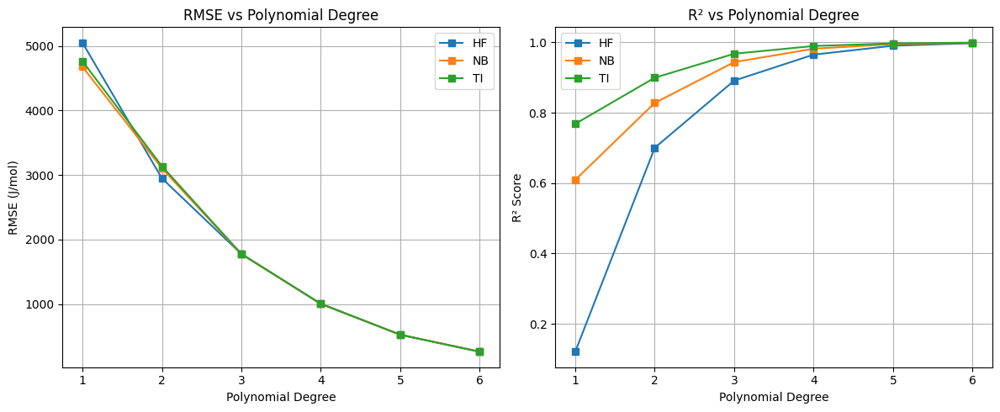

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from pycalphad import Database, Workspace, variables as v
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# ------------------------------------------------------------------------------
# Function to Generate Composition Grid and Fit Driving Forces
# ------------------------------------------------------------------------------

def get_driving_force_3D_fit_balanced(
    db_path='HF_NB_TI_V.TDB',
    phase='BCC_A2',
    hf_range=(0.05, 0.6),
    nb_range=(0.05, 0.6),
    ti_range=(0.05, 0.6),
    x_points=10,
    temperature=1000,
    pressure=101325,
    reference_element='V',
    poly_order=3,
    tolerance=1e-6
):
    x_hf_vals = np.linspace(*hf_range, x_points)
    x_nb_vals = np.linspace(*nb_range, x_points)
    x_ti_vals = np.linspace(*ti_range, x_points)

    elements = ['HF', 'NB', 'TI', reference_element]
    db = Database(db_path)

    valid_comps = []
    driving_forces = {el: [] for el in ['HF', 'NB', 'TI']}  # Only non-ref elements

    for x_hf in x_hf_vals:
        for x_nb in x_nb_vals:
            for x_ti in x_ti_vals:
                x_total = x_hf + x_nb + x_ti
                x_v = 1.0 - x_total
                if x_v < 0 or x_v > 1.0 or abs(x_total + x_v - 1.0) > tolerance:
                    continue

                cond = {
                    v.X('HF'): x_hf,
                    v.X('NB'): x_nb,
                    v.X('TI'): x_ti,
                    v.T: temperature,
                    v.P: pressure
                }

                try:
                    wks = Workspace(database=db, components=elements, phases=[phase], conditions=cond)
                    ip = IsolatedPhase(phase, wks=wks)
                    mu_ref = wks.get(ip(f'MU({reference_element})')).squeeze()

                    mu_i_vals = {}
                    all_valid = True
                    for el in driving_forces:
                        mu_i = wks.get(ip(f'MU({el})')).squeeze()
                        if np.isnan(mu_i):
                            all_valid = False
                            break
                        mu_i_vals[el] = mu_i

                    if all_valid:
                        valid_comps.append([x_hf, x_nb, x_ti])
                        for el in driving_forces:
                            driving_forces[el].append(mu_i_vals[el] - mu_ref)

                except Exception as e:
                    print(f"Skipping HF={x_hf:.2f}, NB={x_nb:.2f}, TI={x_ti:.2f}, V={x_v:.2f}: {e}")
                    continue

    comps = np.array(valid_comps)
    poly = PolynomialFeatures(degree=poly_order)
    X_poly = poly.fit_transform(comps)

    fit_models = {}
    for el, y_vals in driving_forces.items():
        y_vals = np.array(y_vals)
        if np.sum(~np.isnan(y_vals)) < 5:
            print(f"Not enough data for {el}, skipping.")
            continue
        model = LinearRegression().fit(X_poly, y_vals)
        fit_models[el] = model

    return comps, driving_forces, fit_models, poly

# ------------------------------------------------------------------------------
# Function to Evaluate Fit Quality Over Polynomial Orders
# ------------------------------------------------------------------------------

def evaluate_poly_orders(order_range=(1, 6), **kwargs):
    results = {el: {"rmse": [], "r2": []} for el in ['HF', 'NB', 'TI']}

    for order in range(order_range[0], order_range[1] + 1):
        print(f"\n--- Evaluating Polynomial Order {order} ---")
        comps, df_vals, models, transformer = get_driving_force_3D_fit_balanced(
            poly_order=order,
            **kwargs
        )

        for el in ['HF', 'NB', 'TI']:
            if el not in models:
                results[el]["rmse"].append(np.nan)
                results[el]["r2"].append(np.nan)
                continue

            y_true = np.array(df_vals[el])
            X = transformer.transform(comps)
            y_pred = models[el].predict(X)

            rmse = np.sqrt(mean_squared_error(y_true, y_pred))
            r2 = r2_score(y_true, y_pred)

            print(f"{el}: RMSE={rmse:.2f} J/mol, R²={r2:.4f}")
            results[el]["rmse"].append(rmse)
            results[el]["r2"].append(r2)

    # Plot
    degrees = list(range(order_range[0], order_range[1] + 1))
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    for el in ['HF', 'NB', 'TI']:
        axs[0].plot(degrees, results[el]["rmse"], '-s', label=el)
        axs[1].plot(degrees, results[el]["r2"], '-s', label=el)

    axs[0].set_title("RMSE vs Polynomial Degree")
    axs[0].set_xlabel("Polynomial Degree")
    axs[0].set_ylabel("RMSE (J/mol)")
    axs[0].legend()
    axs[0].grid(True)

    axs[1].set_title("R² vs Polynomial Degree")
    axs[1].set_xlabel("Polynomial Degree")
    axs[1].set_ylabel("R² Score")
    axs[1].legend()
    axs[1].grid(True)

    plt.tight_layout()
    plt.show()

evaluate_poly_orders(
    order_range=(1, 6),
    db_path='HF_NB_TI_V.TDB',
    phase='BCC_A2',
    hf_range=(0.05, 0.95),
    nb_range=(0.05, 0.95),
    ti_range=(0.05, 0.95),
    x_points=15,
    temperature=1000,
    pressure=101325,
    reference_element='V'
)

In [10]:
import ternary
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
import matplotlib.tri as tri
import numpy as np

def barycentric_to_cartesian(hf, nb, ti):
    # Convert barycentric (HF, NB, TI) to 2D Cartesian for plotting
    x = 0.5 * (2*nb + ti)
    y = (np.sqrt(3)/2) * ti
    return x, y

def plot_driving_force_with_matplotlib(comps, driving_force, element='HF', fontsize=14, n_contours=10):
    hf = np.array([c[0] for c in comps])
    nb = np.array([c[1] for c in comps])
    ti = 1.0 - hf - nb
    z = np.array(driving_force[element])

    x, y = barycentric_to_cartesian(hf, nb, ti)
    triang = tri.Triangulation(x, y)

    fig, ax = plt.subplots(figsize=(7.5, 6.8))
    tpc = ax.tripcolor(triang, z, cmap='viridis', shading='gouraud')

    # Slim colorbar on the right
    cbar_ax = fig.add_axes([0.77, 0.2, 0.015, 0.6])  # [left, bottom, width, height]
    cbar = plt.colorbar(tpc, cax=cbar_ax)
    cbar.set_label(f'Δμ({element}) [J/mol]', fontsize=fontsize-2)
    cbar.ax.tick_params(labelsize=fontsize-4)  # Smaller ticks
    
    # Contour lines
    contours = ax.tricontour(triang, z, levels=n_contours, colors='k', linewidths=0.75)
    ax.clabel(contours, inline=True, fontsize=fontsize-5, fmt="%.0f")

    # Triangle border
    triangle_x = [0, 1, 0.5, 0]
    triangle_y = [0, 0, np.sqrt(3)/2, 0]
    ax.plot(triangle_x, triangle_y, 'k-', lw=2)

    # Corner labels
    ax.text(-0.04, -0.04, 'HF', ha='right', va='top', fontsize=fontsize, weight='bold')
    ax.text(1.04, -0.04, 'NB', ha='left', va='top', fontsize=fontsize, weight='bold')
    ax.text(0.5, np.sqrt(3)/2 + 0.04, 'TI', ha='center', va='bottom', fontsize=fontsize, weight='bold')

    # Ticks on HF-NB edge (TI = 0)
    for i in np.linspace(0.1, 0.9, 5):
        x, y = barycentric_to_cartesian(i, 1 - i, 0)
        ax.text(x, y - 0.04, f"{i:.1f}", ha='center', va='top', fontsize=fontsize-4)
    
    # Ticks on NB-TI edge (HF = 0)
    for i in np.linspace(0.1, 0.9, 5):
        x, y = barycentric_to_cartesian(0, i, 1 - i)
        ax.text(x + 0.03, y, f"{i:.1f}", ha='left', va='center', fontsize=fontsize-4)
    
    # Ticks on TI-HF edge (NB = 0)
    for i in np.linspace(0.1, 0.9, 5):
        x, y = barycentric_to_cartesian(i, 0, 1 - i)
        ax.text(x - 0.03, y, f"{i:.1f}", ha='right', va='center', fontsize=fontsize-4)

    ax.set_title(f"Δμ({element}) Ternary Map (HF-NB-TI)", fontsize=fontsize+1, pad=15)
    ax.set_aspect('equal')
    ax.set_xlim(-0.1, 1.1)
    ax.set_ylim(-0.1, np.sqrt(3)/2 + 0.1)
    ax.axis('off')
    plt.tight_layout(rect=[0, 0, 0.83, 1])  # Adjust layout to make room for colorbar
    plt.show()

def plot_driving_force_ternary(comps, driving_force, element='HF'):
    import ternary
    import matplotlib.pyplot as plt

    scale = 1.0
    data = {}

    for idx, (x_hf, x_nb, x_v) in enumerate(comps):
        x_ti = 1.0 - x_hf - x_nb - x_v
        if x_ti < 0.0 or x_ti > 1.0:
            continue
    
        key = (round(float(x_hf), 4), round(float(x_nb), 4), round(float(x_ti), 4))
        value = float(driving_force[element][idx])
        data[key] = value

    if not data:
        raise ValueError("No valid data points in ternary map — check composition constraints.")

    #print(data)

    print("Sample key:", list(data.keys())[0])
    print("Type of entries in key:", [type(x) for x in list(data.keys())[0]])
    
    fig, ax = plt.subplots(figsize=(8, 7))
    tax = ternary.TernaryAxesSubplot(ax=ax, scale=scale)
    tax.set_title(f"Δμ({element}) Ternary Map (HF-NB-TI)", fontsize=14)
    tax.boundary(linewidth=2.0)
    tax.gridlines(color="gray", multiple=0.1)
    tax.ticks(axis='lbr', linewidth=1, multiple=0.1, tick_formats="%.1f")

    tax.heatmap(data, style="triangular", cmap='viridis', colorbar=True)
    tax.left_axis_label("NB", fontsize=12)
    tax.right_axis_label("TI", fontsize=12)
    tax.bottom_axis_label("HF", fontsize=12)
    tax.clear_matplotlib_ticks()

    # Optional debug scatter overlay
    #tax.scatter(list(data.keys()), marker='o', color='red', s=5)

    tax.show()

In [11]:
comps, df_vals, models, transformer = get_driving_force_3D_fit_balanced(
    db_path='HF_NB_TI_V.TDB',
    phase='BCC_A2',
    hf_range=(0.05, 0.6),
    nb_range=(0.05, 0.6),
    ti_range=(0.05, 0.6),
    x_points=10,
    temperature=1000,
    pressure=101325,
    reference_element='V',
    poly_order=6,
    tolerance=1e-6
)

/Users/attari.v/Documents/PROJECTS/pycalphad/pycalphad/io/tdb.py:995: UserWarning: The type definition character `%` was defined in the following phases: ['BCC_A2', 'HCP_A3'], but no corresponding TYPE_DEFINITION line was found in the TDB.
  warnings.warn(f"The type definition character `{typechar}` was defined in the following phases: "


/var/folders/c8/_nk485717633nprdcc0cx8gm0000gq/T/ipykernel_6230/2913936909.py:66: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.83, 1])  # Adjust layout to make room for colorbar


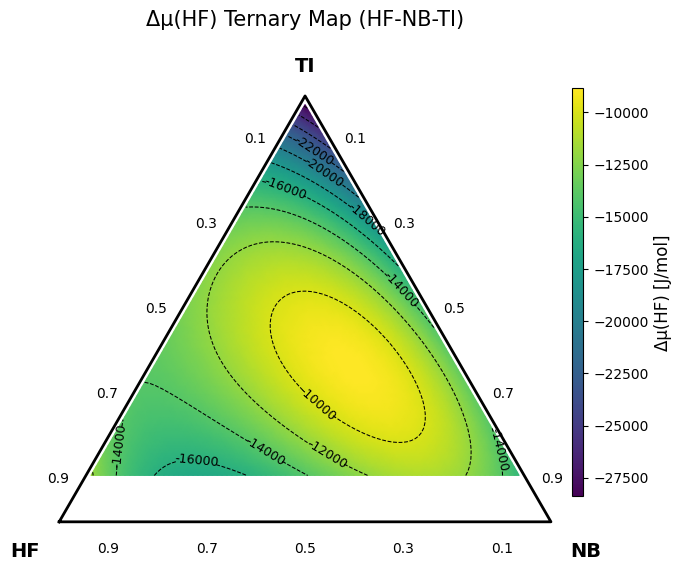

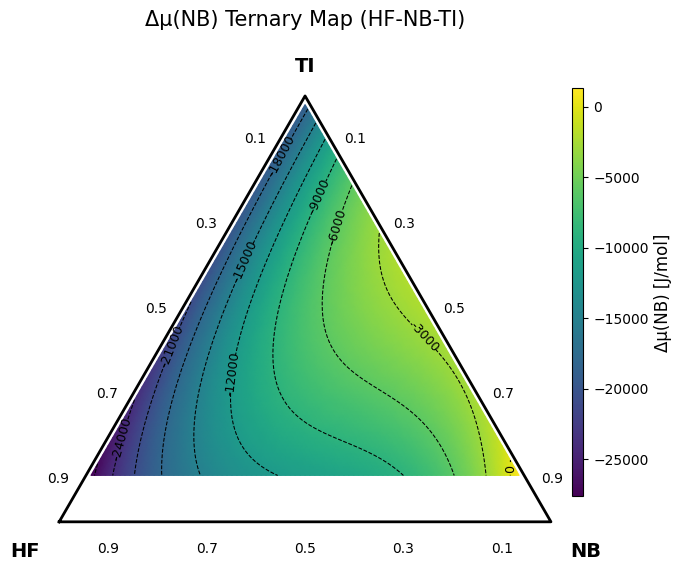

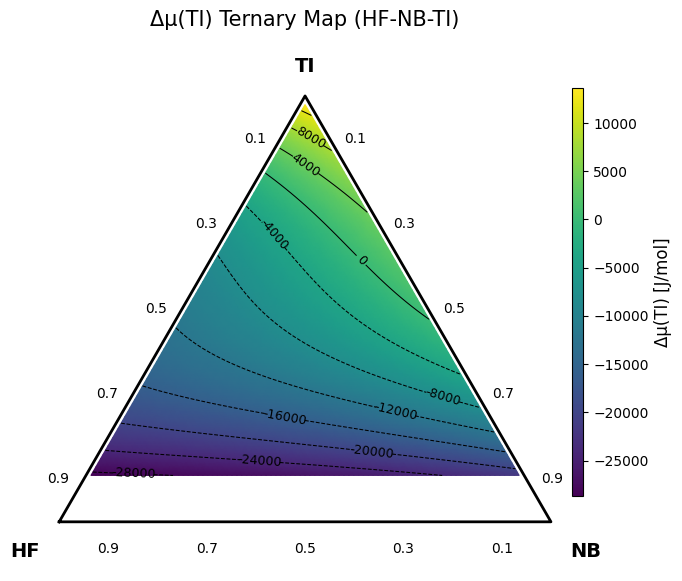

In [40]:
def generate_comps_and_driving_force(models, transformer, 
                                     hf_range=(0.01, 0.99),
                                     nb_range=(0.01, 0.99),
                                     fixed_v=0.1,
                                     x_points=100):
    hf_vals = np.linspace(*hf_range, x_points)
    nb_vals = np.linspace(*nb_range, x_points)

    HF, NB = np.meshgrid(hf_vals, nb_vals, indexing='ij')
    HF_flat = HF.ravel()
    NB_flat = NB.ravel()

    # Compute TI = 1 - HF - NB - V
    TI_flat = 1.0 - HF_flat - NB_flat - fixed_v

    # Filter valid comps (TI >= 0)
    valid_mask = TI_flat >= 0.0
    hf_valid = HF_flat[valid_mask]
    nb_valid = NB_flat[valid_mask]
    ti_valid = TI_flat[valid_mask]
    v_valid = np.full_like(hf_valid, fixed_v)

    comps = np.vstack([hf_valid, nb_valid, ti_valid]).T
    comps_all = np.vstack([hf_valid, nb_valid, ti_valid, v_valid]).T

    df_vals = {el: [] for el in models.keys()}

    for row in comps:
        X_eval = transformer.transform([row])
        for el in models:
            mu = models[el].predict(X_eval)[0]
            df_vals[el].append(float(mu))

    return comps, comps_all, df_vals

# call

comps, comps_all, df_vals = generate_comps_and_driving_force(models, transformer, fixed_v=0.1)

#print(comps_all)
#print(df_vals)

# Plot ternary driving force map
#plot_driving_force_ternary(comps, df_vals, element='HF')
plot_driving_force_with_matplotlib(comps, df_vals, element='HF')
plot_driving_force_with_matplotlib(comps, df_vals, element='NB')
plot_driving_force_with_matplotlib(comps, df_vals, element='TI')

# Phase-field Solver using 3D chemcial potential calculator
## Material system is Hf$_{1-x-y}$Nb$_{x}$Ti$_{y}$V$_{0.1}$
## $x_V$ is fixed at 0.1

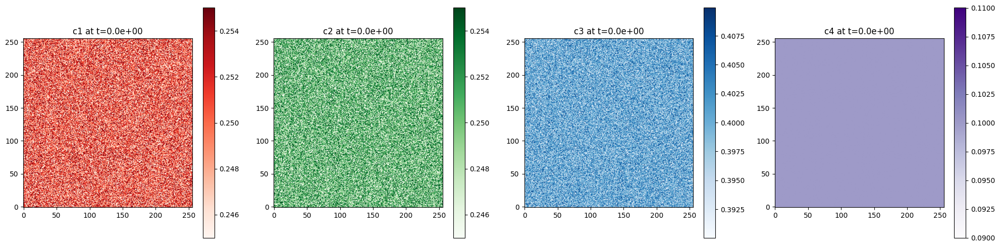

100%|████████████████████████████████████████████████████████████████████████████████████████████████████▌| 797/800 [00:12<00:00, 80.84it/s]

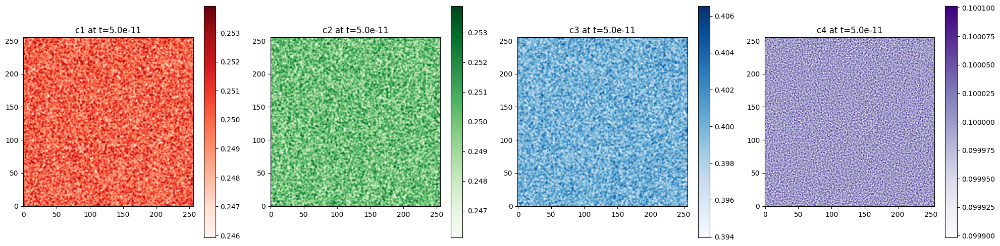

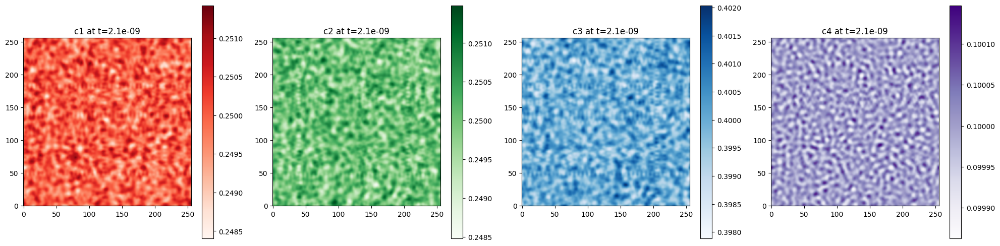

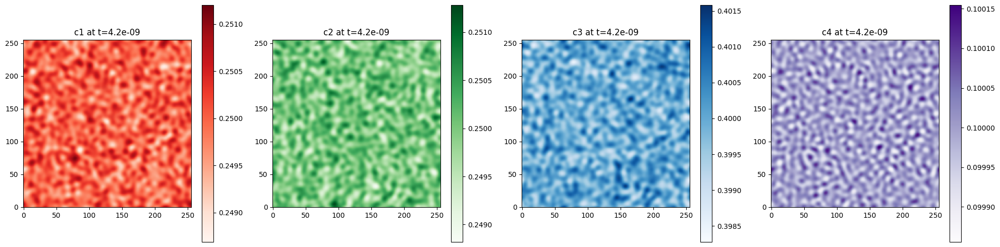

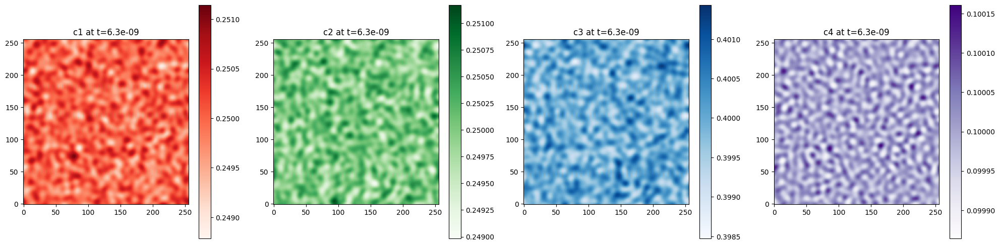

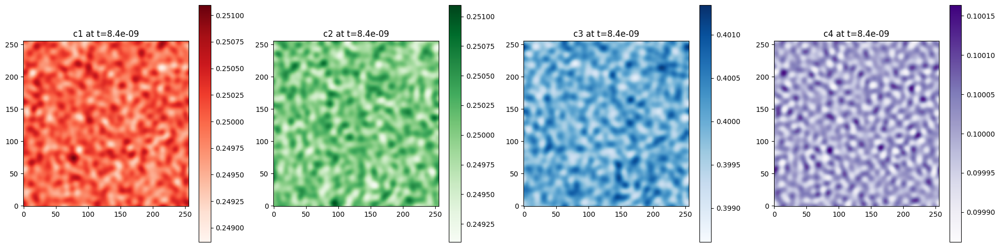

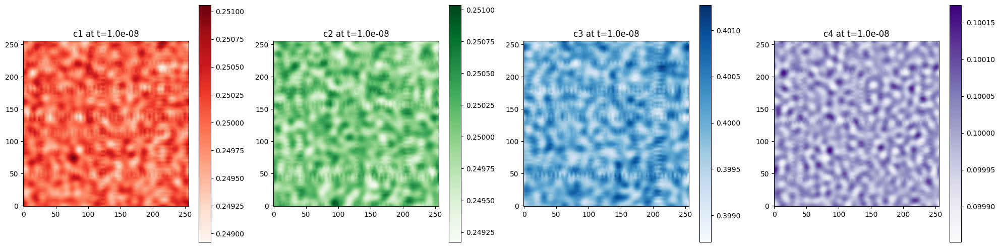

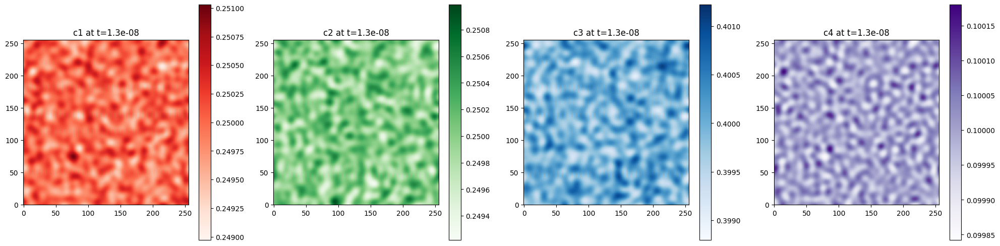

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2
from sklearn.preprocessing import PolynomialFeatures
from tqdm import tqdm
import os

# ==== Load pre-trained models and transformer ====
# Assumes you have already trained these and saved/imported them earlier
# Example:
# from my_fitting_module import models, transformer

# ==== Simulation Parameters ====
Kappa_c = 40.0e-15
M = 1.0e-15
temp = 1000

# ==== Grid Setup ====
Lx = 100e-9
N = 256
h = Lx / (N - 1)
x = np.linspace(0, Lx, N)
y = x.copy()
xx, yy = np.meshgrid(x, y)

# ==== Spectral k-vectors ====
k = np.concatenate((np.arange(0, N//2), [0], np.arange(-N//2+1, 0)))
g = 2 * np.pi / Lx
kx = g * 1j * k
ky = g * 1j * k
kx, ky = np.meshgrid(kx, ky)
k2 = kx**2 + ky**2

# ==== Time Setup ====
dt = 0.05e-9
tmax = 40e-9
max_iter = int(tmax / dt)
plot_indices = np.linspace(0, max_iter, 20, dtype=int)

# ==== Initial Conditions ====
np.random.seed(0)
c1 = 0.25 + 0.01 * (np.random.rand(N, N) - 0.5)  # HF
c2 = 0.25 + 0.01 * (np.random.rand(N, N) - 0.5)   # NB
c3 = 1 - c1 - c2 - 0.1 #0.25 + 0.01 * (np.random.rand(N, N) - 0.5)  # TI
c4 = 1.0 - c1 - c2 - c3

# ==== Initial Plot ====
n = 0
plt.figure(figsize=(20, 5))
for idx, (c, label, cmap) in enumerate(zip([c1, c2, c3, c4], ['c1', 'c2', 'c3', 'c4'], ['Reds', 'Greens', 'Blues', 'Purples'])):
    plt.subplot(1, 4, idx+1)
    plt.imshow(c, cmap=cmap, origin='lower')
    plt.title(f'{label} at t={n*dt:.1e}')
    plt.colorbar()
plt.tight_layout()
plt.savefig(f'microstructure-quaternary-real/quaternary_frame_{n}.jpg')
plt.show()
plt.close()

# ==== Output Directory ====
if os.path.exists("microstructure-quaternary-real"):
    os.system("rm -r microstructure-quaternary-real")
os.makedirs("microstructure-quaternary-real", exist_ok=True)

# ==== Simulation Loop ====
for n in tqdm(range(1, max_iter + 1)):
    # Ensure mass balance
    c4 = 1.0 - c1 - c2 - c3

    # === Polynomial chemical potential model ===
    X_input = np.stack([c1.ravel(), c2.ravel(), c3.ravel()], axis=-1)
    X_poly = transformer.transform(X_input)

    mu1 = models['HF'].predict(X_poly).reshape(N, N)
    mu2 = models['NB'].predict(X_poly).reshape(N, N)
    mu3 = models['TI'].predict(X_poly).reshape(N, N)

    # Spectral evolution
    mu1_hat = fft2(mu1)
    mu2_hat = fft2(mu2)
    mu3_hat = fft2(mu3)
    c1_hat = fft2(c1)
    c2_hat = fft2(c2)
    c3_hat = fft2(c3)
    denom = 1 + 2 * M * Kappa_c * dt * k2**2

    c1 = np.real(ifft2((c1_hat + M * dt * k2 * mu1_hat) / denom))
    c2 = np.real(ifft2((c2_hat + M * dt * k2 * mu2_hat) / denom))
    c3 = np.real(ifft2((c3_hat + M * dt * k2 * mu3_hat) / denom))
    c4 = 1.0 - c1 - c2 - c3

    # Clip to [0,1] range
    #for c in [c1, c2, c3, c4]:
    #    np.clip(c, 0.0, 1.0, out=c)

    # Output visualization
    if n == 1 or n in plot_indices or n == max_iter:
        plt.figure(figsize=(20, 5))
        for idx, (c, label, cmap) in enumerate(zip([c1, c2, c3, c4], ['c1', 'c2', 'c3', 'c4'], ['Reds', 'Greens', 'Blues', 'Purples'])):
            plt.subplot(1, 4, idx+1)
            plt.imshow(c, cmap=cmap, origin='lower')
            plt.title(f'{label} at t={n*dt:.1e}')
            plt.colorbar()
        plt.tight_layout()
        plt.savefig(f'microstructure-quaternary-real/quaternary_frame_{n}.jpg')
        plt.close
        if n == max_iter:
            plt.show()
            plt.close